## Perform surgery on reference model and train on query dataset without cell type labels

In [1]:
import os
import sys

sys.path.append('../utils')
from functions import plot_training_history, map_gene_symbols_to_ensembl

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import scanpy as sc
import scarches as sca

 captum (see https://github.com/pytorch/captum).


In [2]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
# TODO maybe this is what achieved high accuracy>
torch.set_float32_matmul_precision("high")
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [3]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_raydefault_epocs300-300'
backup_dir = '/root/datos/maestria/netopaas/luca_explore/surgeries'
ext_name = "Trinks_Bishoff_2021_NSCLC"
name = 'Bishoff'
surgery_path = f'{backup_dir}/{name}'

In [4]:
condition_key = 'sample'
cell_type_key = 'cell_type_tumor'

## Import

In [43]:
bish = sc.read_h5ad(f'{backup_dir}/filtered_{ext_name}.h5ad')

/usr/local/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [44]:
bish

AnnData object with n_obs × n_vars = 11620 × 33538
    obs: 'sample', 'patient_id', 'tissue_type', 'W_no', 'date_of_surgery', 'topography', 'morphology', 'histo_subtype', 'tnm', 'sex', 'age', 'frozen', 'ffpe', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [5]:
target_adata = sc.read_h5ad(f'{backup_dir}/filtered_{ext_name}.h5ad')
target_adata.obs[cell_type_key] = 'Unknown'

/usr/local/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


WE DO THIS SO THAT WE DO NOT COLLIDE WITH THE BAROCEDES OF THE REAF ATLAS, BUT IF YOU DONT HAVE BARCOEDS DUNT RUN THIS

## Convert to Ensembl

In [41]:
target_adata

AnnData object with n_obs × n_vars = 11620 × 24542
    obs: 'sample', 'patient_id', 'tissue_type', 'W_no', 'date_of_surgery', 'topography', 'morphology', 'histo_subtype', 'tnm', 'sex', 'age', 'frozen', 'ffpe', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'cell_type_tumor'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'symbol', 'ensembl_gene_id'

In [8]:
from importlib import reload
import functions as ut
reload(ut)

<module 'functions' from '/root/host_home/luca/nb_annotRefatlas/../utils/functions.py'>

In [9]:
output_csv_path = f'{surgery_path}/{name}_ensembl.csv'

try:
    os.mkdir(surgery_path)
    print(f"Directory '{surgery_path}' created successfully.")
except FileExistsError:
    print(f"Directory '{surgery_path}' already exists.")

target_adata.var['symbol'] = target_adata.var.index
if not os.path.exists(output_csv_path):
    target_adata = ut.map_gene_symbols_to_ensembl(target_adata, output_csv_path)
    target_adata.var.index = target_adata.var['ensembl_gene_id']
else:
    # ensembl = pd.read_csv(output_csv_path)
    target_adata.var.index = ensembl.ensembl_gene_id.astype(str)
    target_adata.var['ensembl_gene_id'] = target_adata.var.index


Directory '/root/datos/maestria/netopaas/luca_explore/surgeries/Bishoff' already exists.


In [10]:
target_adata.var.index = target_adata.var['ensembl_gene_id'].astype(str)
target_adata.var

,mito,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,symbol,ensembl_gene_id
ensembl_gene_id,,,,,,,,,
ENSG00000243485,False,0,0.000000,0.000000,100.000000,0.0,0.000000,MIR1302-2HG,ENSG00000243485
ENSG00000237613,False,0,0.000000,0.000000,100.000000,0.0,0.000000,FAM138A,ENSG00000237613
ENSG00000186092,False,0,0.000000,0.000000,100.000000,0.0,0.000000,OR4F5,ENSG00000186092
ENSG00000237683,False,30,0.002582,0.002578,99.741824,30.0,3.433987,AL627309.1,ENSG00000237683
nan,False,3,0.000258,0.000258,99.974182,3.0,1.386294,AL627309.3,NaN
...,...,...,...,...,...,...,...,...,...
nan,False,9,0.003012,0.003008,99.922547,35.0,3.583519,AC233755.2,NaN
nan,False,10,0.001635,0.001634,99.913941,19.0,2.995732,AC233755.1,NaN
nan,False,213,0.020052,0.019853,98.166954,233.0,5.455321,AC240274.1,NaN


In [11]:
target_adata = target_adata[:, ~target_adata.var.index.duplicated(keep='first')].copy() # create a copy to avoid modifying the original object
target_adata.var.index = pd.Index(target_adata.var.index) # convert to a plain Index object, which enforces uniqueness

## Prepare query

In [12]:
adata_query = sca.models.SCANVI.prepare_query_anndata(
    adata = target_adata,
    # return_reference_var_names=True,
    reference_model = ref_path,
    inplace=False)

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024
         _raydefault_epocs300-300/model.pt already downloaded                                                      
INFO     Found 93.32108866254801% reference vars in query data.                                                    


/usr/local/lib/python3.11/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_location)

Some fixes to be able to serialize

In [13]:
adata_query.obs.index.name = 'index'
adata_query.obs.index = adata_query.obs.index.astype("O")

In [14]:
adata_query.write_h5ad(f'{surgery_path}/query.h5ad')
# adata_query = sc.read_h5ad(f'{surgery_path}/query.h5ad')

## Train

In [15]:
adata_query

AnnData object with n_obs × n_vars = 11620 × 5989
    obs: 'sample', 'patient_id', 'tissue_type', 'W_no', 'date_of_surgery', 'topography', 'morphology', 'histo_subtype', 'tnm', 'sex', 'age', 'frozen', 'ffpe', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'cell_type_tumor'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'symbol', 'ensembl_gene_id'

In [16]:
adata_query.obs['dataset'] = adata_query.obs[condition_key]
adata_query.obs['sample'] = adata_query.obs[condition_key]
# scvi.settings.batch_size = 1024

model = sca.models.SCANVI.load_query_data(
    adata_query,
    ref_path,
    freeze_dropout = True,
)
model._unlabeled_indices = np.arange(adata_query.n_obs)
model._labeled_indices = []
print("Labelled Indices: ", len(model._labeled_indices))
print("Unlabelled Indices: ", len(model._unlabeled_indices))

INFO     File                                                                                                      
         /root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024
         _raydefault_epocs300-300/model.pt already downloaded                                                      


/usr/local/lib/python3.11/site-packages/scvi/model/base/_utils.py:66: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, map_location=map_location)

Labelled Indices:  0
Unlabelled Indices:  11620


In [17]:
early_stopping_kwargs = {
    "early_stopping_monitor": "elbo",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
}
# # This very importanto for actual covnergence... we have seen we tend to hit local minima and this helps i navoiding but only once...  a peridic approach would ve good
plan_kwargs= {
    "weight_decay": 0.0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}
import scvi
scvi.settings.num_workers = 30

model.train(
    max_epochs=200,
    check_val_every_n_epoch=10,
    batch_size=256,
    early_stopping=early_stopping_kwargs, 
    plan_kwargs=plan_kwargs
)

INFO     Training for 200 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck.

Epoch 200/200: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [1:14:44<00:00, 22.25s/it, v_num=1, train_loss_step=1.96e+3, train_loss_epoch=1.86e+3]

INFO: `Trainer.fit` stopped: `max_epochs=200` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|███████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [1:14:44<00:00, 22.42s/it, v_num=1, train_loss_step=1.96e+3, train_loss_epoch=1.86e+3]


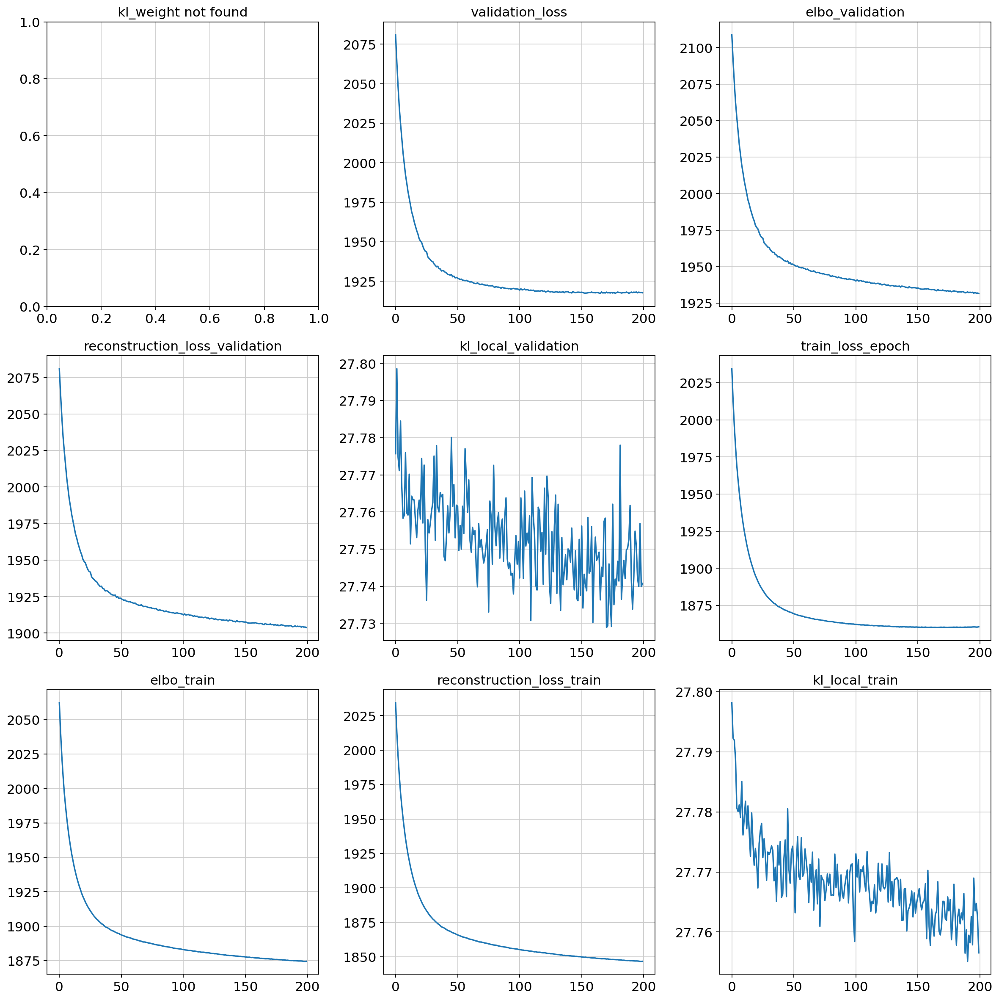

In [18]:
history_keys = [
    'kl_weight', 'validation_loss', 'elbo_validation', 
    'reconstruction_loss_validation', 'kl_local_validation', 
    'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 
    'kl_local_train'
]

# Assuming scanvae.history contains the training history
plot_training_history(model.history, history_keys)

In [20]:
! ls $surgery_path/sample_batch

ls: cannot access '/root/datos/maestria/netopaas/luca_explore/surgeries/Bishoff/sample_batch': No such file or directory


/usr/local/lib/python3.11/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [21]:
model.save(f'{surgery_path}/', overwrite=True)
# model = sca.models.SCANVI.load(surgery_path, adata_query)

In [22]:
query_latent = sc.AnnData(model.get_latent_representation())
query_latent.write_h5ad(f'{surgery_path}/query_latent.h5ad')
# query_latent = sc.read_h5ad(f'{surgery_path}/query_latent.h5ad')

## Get predictions (VAE)

### Import

In [76]:
# adata_query = sc.read_h5ad(f'{surgery_path}/query.h5ad')
# model = sca.models.SCANVI.load(surgery_path, adata_query)
# query_latent = sc.AnnData(model.get_latent_representation())
# print(adata_query)
# model

### Predict

In [23]:
model

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 1024, n_latent: 10, n_layers: 4, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

In [24]:
query_latent.obs['cell_type'] = model.predict()
query_latent.obs['batch'] = adata_query.obs[condition_key].tolist()
query_latent.obs.index = adata_query.obs.index

## Comparison

### Merge their predictions

We will be comparing against their annotation so we will have to do ajoin in the barcodes. 
We must also import their annots.
In the Zuani notebook we had to do an elaborate barcode matching but here there is no need. Consult there if needed.

In [25]:
annots_df = target_adata.obs.loc[:, 'assigned_cell_type']
query_latent.obs.index = adata_query.obs.index
annots_joined = pd.DataFrame.join(query_latent.obs, annots_df, how='left')
annots_joined

KeyError: 'assigned_cell_type'

In [24]:
query_latent.obs = annots_joined
query_latent.obs.rename(columns = {'assigned_cell_type': 'source_type'}, inplace=True)
query_latent.obs['source_type'].isna().sum()

0

In [25]:
cell_map = {0 : 'T',
1 : 'Myeloid',
2 : 'Epithelial',
3 : 'NK',
4 : 'B',
5 : 'MAST',
6: 'Fibroblasts',
7: 'Endothelial'
}

query_latent.obs['source_type'] = query_latent.obs['source_type'].apply(lambda x: cell_map[x])

We will start comparing the types, to do that it is very important to have the article in mind and the caveat sof how they annotated their cells.

In this figure we can see the proportions of types of cells and the types of samples that were analyzed.

It is also useful to have a visualization of the main kind of cells that are in the alveoli:

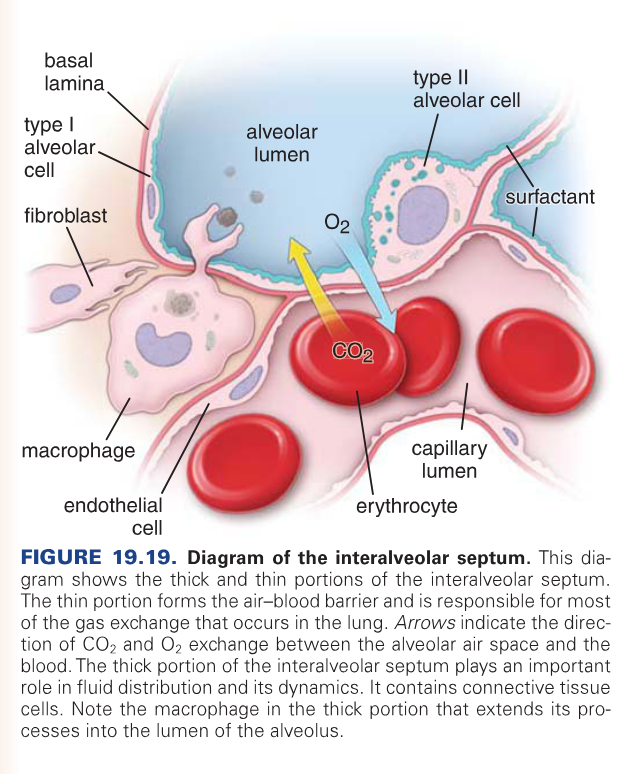

### UMAPs

In [154]:
sc.pp.neighbors(query_latent)
sc.tl.leiden(query_latent)
sc.tl.umap(query_latent)

/tmp/ipykernel_117316/1132601513.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(query_latent)
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


In [163]:
query_latent

AnnData object with n_obs × n_vars = 421711 × 20
    obs: 'cell_type', 'batch', 'source_type'
    uns: 'neighbors', 'leiden', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

/usr/local/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/usr/local/lib/python3.11/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


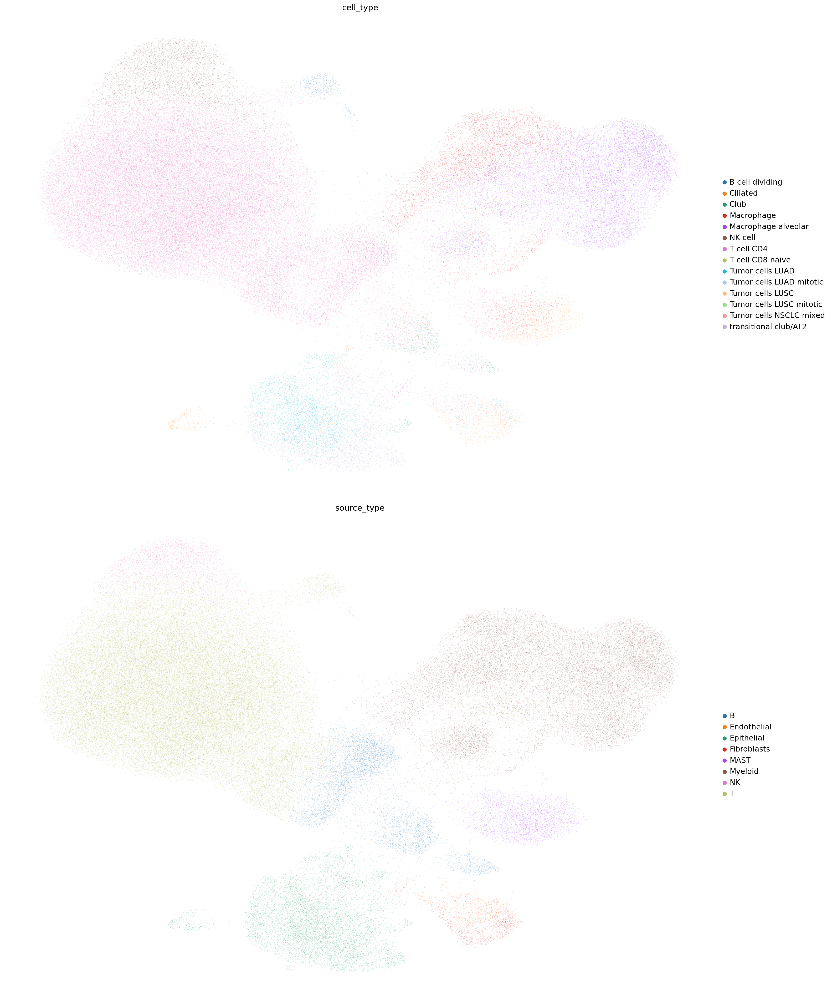

In [165]:
fig, axes = plt.subplots(nrows=2, figsize=(20, 24))  # Adjust figsize as needed

query_plot = query_latent[query_latent.obs.source_type.str.contains('').astype(bool)]
query_plot = query_plot[np.logical_not(query_plot.obs.source_type.isna())]

# Plot the UMAP with 'cell_type' on the first row
sc.pl.umap(
    query_plot,
    color="cell_type",
    frameon=False,
    ax=axes[0],  # Assign to the first subplot
    show=False   # Suppress immediate display to adjust layout later
)

# Plot the UMAP with 'source_type' on the second row
sc.pl.umap(
    query_plot,
    color=["source_type"],
    frameon=False,
    ax=axes[1],  # Assign to the second subplot
    show=False   # Suppress immediate display to adjust layout later
)

# Adjust spacing to accommodate legends
plt.tight_layout()  # Automatically adjusts spacing
plt.show()

One can see that for many cell types there is a main accumulation where the prediction and annotation intersect, but there are many outliers.

It is difficult to see very much here, because of the abundance of types, the colours resemble each other. An interactive UMAP, may help us in locating the cell types we are wishing to compare.

### Interactive UMAPs

In [167]:
# Extract UMAP coordinates and metadata
umap_coords = query_latent.obsm['X_umap']  # UMAP coordinates
metadata = query_latent.obs  # Metadata

# Create a DataFrame for Altair
df = pd.DataFrame(umap_coords, columns=['UMAP1', 'UMAP2'])
df.index = metadata.index
df = df.join(metadata)  # Join metadata with UMAP coordinates

In [170]:
import altair as alt

# Define your Altair chart
chart = alt.Chart(df.sample(5000)).mark_point().encode(
    x='UMAP1',
    y='UMAP2',
    color='source_type',
    tooltip='cell_type',
).interactive()

# Display the chart
chart

alt.Chart(...)

### Confusion Matrix Heatmap

A relative abundance heatmap is more useful for checking the intersection of our predicted cell types against their marker gene annotated cell types.


This next one with clustering in the rows lets us see the groups of their cell types, that intersect with our predicted cell types.

### With sample as batch

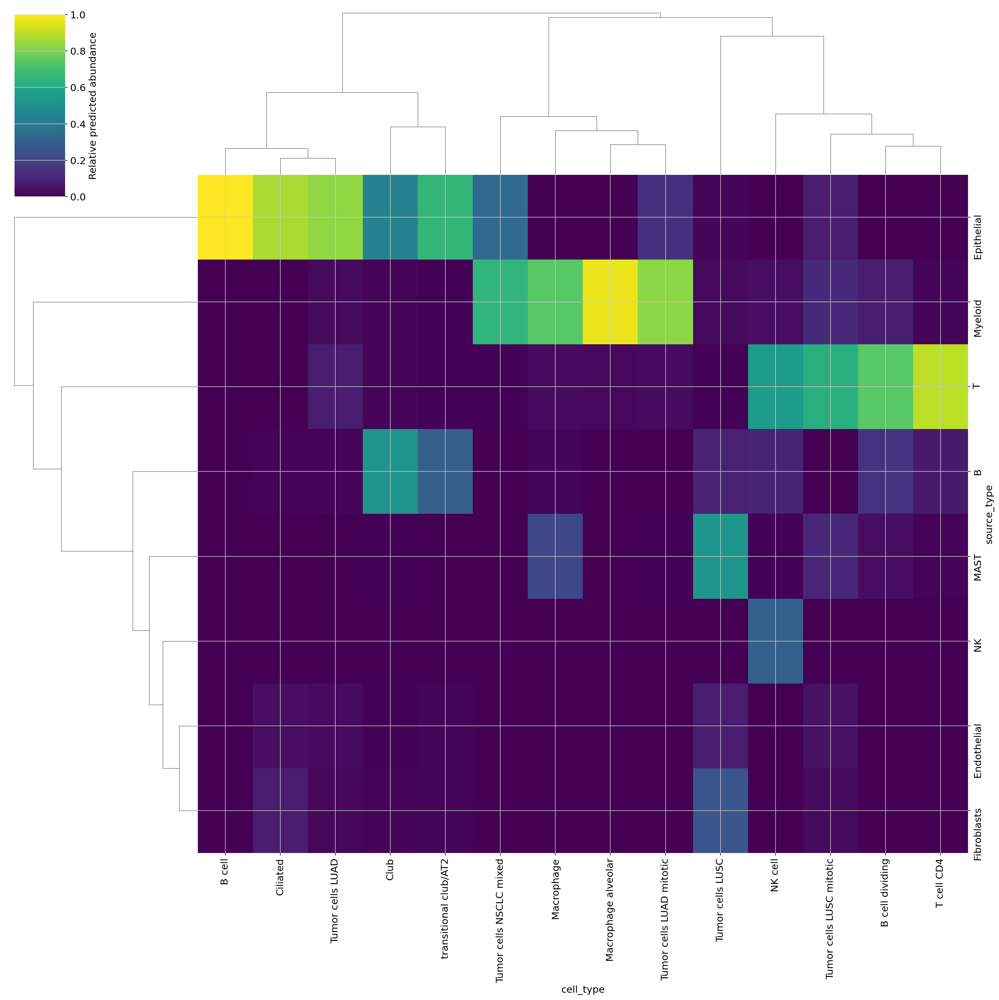

In [26]:
import seaborn as sns

df = query_latent.obs.groupby(["source_type", "cell_type"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)
# corr_matrix = norm_df.corr()

axs = sns.clustermap(norm_df, row_cluster=True, cmap="viridis", cbar_kws={'label': 'Relative predicted abundance'},
                    figsize=(20,20))

# axs.ax_heatmap.set_xlabel('Predicted')
# axs.ax_heatmap.set_ylabel('Source')

### With dataset as batch

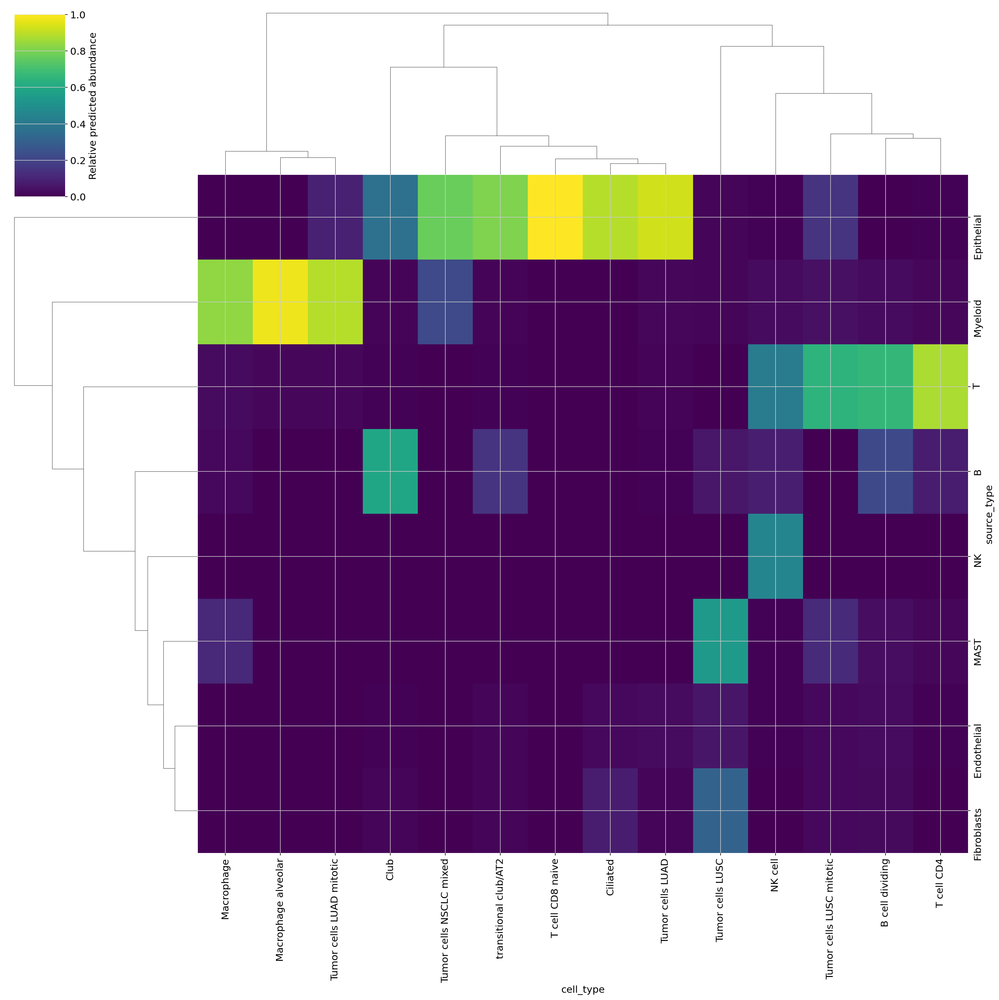

In [171]:
import seaborn as sns

df = query_latent.obs.groupby(["source_type", "cell_type"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)
# corr_matrix = norm_df.corr()

axs = sns.clustermap(norm_df, row_cluster=True, cmap="viridis", cbar_kws={'label': 'Relative predicted abundance'},
                    figsize=(20,20))

# axs.ax_heatmap.set_xlabel('Predicted')
# axs.ax_heatmap.set_ylabel('Source')

As we can see the types sort of line up.

We can cluster for the predicted types to get other info:

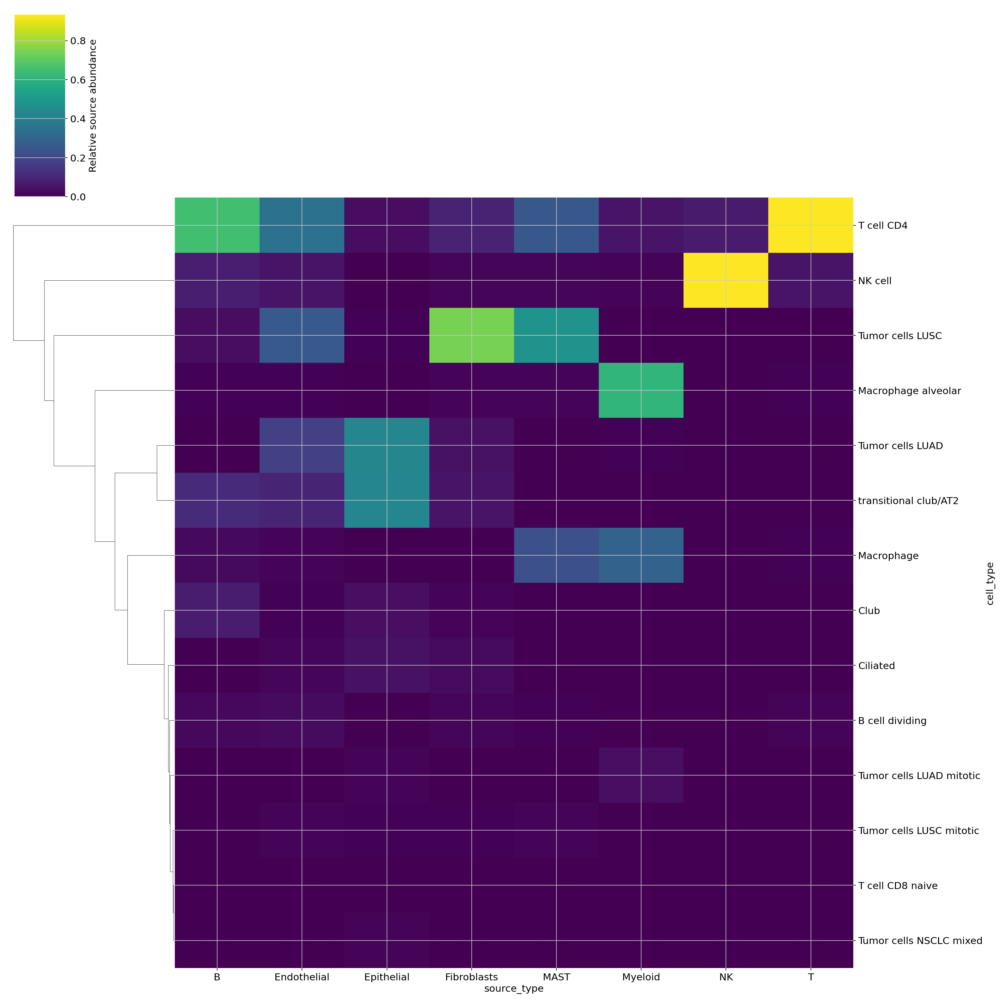

In [172]:
df = query_latent.obs.groupby(["cell_type", "source_type"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)
# corr_matrix = norm_df.corr()

axs = sns.clustermap(norm_df, col_cluster=False, cmap="viridis", cbar_kws={'label': 'Relative source abundance'},
                    figsize=(20,20))

# axs.ax_heatmap.set_xlabel('Predicted')
# axs.ax_heatmap.set_ylabel('Source')

This visualizaton lets us see the types of cells from which we dont have much of. And we can see that there not many endothelial cell types. In general not many cell types corresponding to the stroma and mesoderm.

Another important feature  of this plot is that we can use the columns to see the proportions of assignment fom the source types to our annotation .As this mastrix is normalized for source_type. From this we can see some interesting cases:

- What they deifne as exhausted T cells, with expression of IGIT CTLA$ PDCD1 and LAG3, can also be observed in Tregs and CD4+ T cells. We can see that they are indeed classifed as such. Though a semantic appraoch would not assign those cells to this phenotype. This strange assignemnt brings our accuracy down a lot. Curiuosly, noe of thse cells are assigned as CD8 exhausted T cells.

- Exhausted cytotix T cells 2 are totaly misclassifed as B cells and Tregs. Though their sings of exhaustion could be also present.


### Marker genes for wrong predictions

Check if something similar to the gene name we are looking for is present

In [339]:
list(adata_query.var.symbol[adata_query.var.symbol.str.contains('PDPN').astype(bool)].unique())

[nan, 'PDPN']

In [173]:
adata_query

AnnData object with n_obs × n_vars = 421711 × 5989
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'assigned_cell_type', 'stage', 'Ecotype', 'ecoRecovery', 'Patient Number', 'Group', 'Sex', 'Age （years）', 'Current or former smoking', 'Cancer history', 'Tumor location', 'Tumor size（cm）', 'Pathology', 'Histological subtype', 'T stage', 'N stage', 'M stage', 'Pathological stage', 'cell_type_tumor', 'dataset', 'sample', '_scvi_batch', '_scvi_labels'
    var: 'features', 'symbol', 'ensembl_gene_id'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_tsne', 'X_umap'
    layers: 'data'

In [240]:
# Saving count data
adata_query.obs['source_type'] = query_latent.obs['source_type']
adata = adata_query
adata.layers["counts"] = adata.X.copy()

In [241]:
# Normalizing to median total counts to have comparability
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

We check our AT2 cells for the presence of surfactant protein A, that is essential for for the building of the surfactant that prevents alveolar sacs collapsing.

<Axes: ylabel='Frequency'>

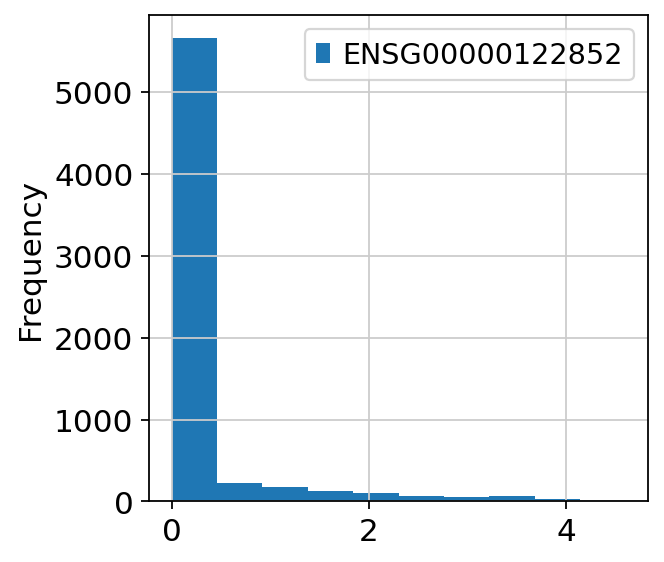

In [351]:
adata[ adata.obs.source_type=="AT2 cells", adata.var.symbol=="SFTPA1"].to_df().plot.hist()

It is stangely not present in their annotation. But is it in ours?

<Axes: ylabel='Frequency'>

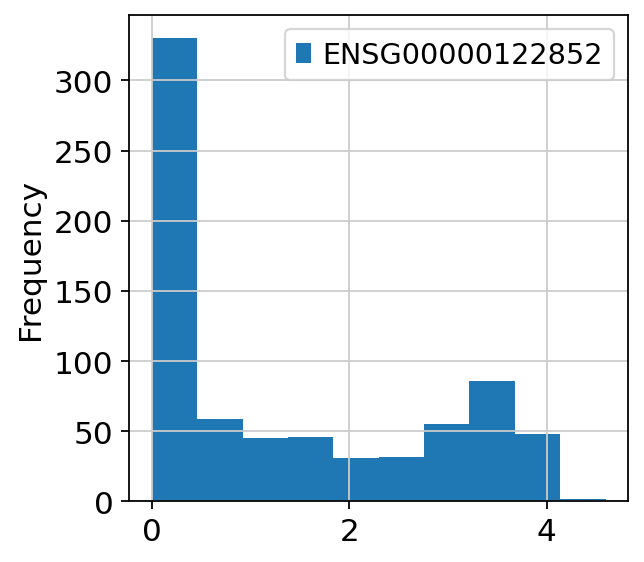

In [368]:
adata[ adata.obs.cell_type=="Alveolar cell type 2", adata.var.symbol=="SFTPA1"].to_df().plot.hist()

It is present in ours, which maybe points to a bad annotation on their part.

We also check for presence of PDPN or T1 alpha in aveolar cells type 1. It has been identified as a differentation marker from AT2 to AT1 cells. It is mucin protein, whose function is not totally understood.

The article mentions that AT1 cells tend no to appear in scRNAseq studies, apparently because of the process of dissociation by tripsin. 
Coincidentally we can see in the below histogram that we have few of them But the ones that we do have do present a normal level of PDPN.

<Axes: ylabel='Frequency'>

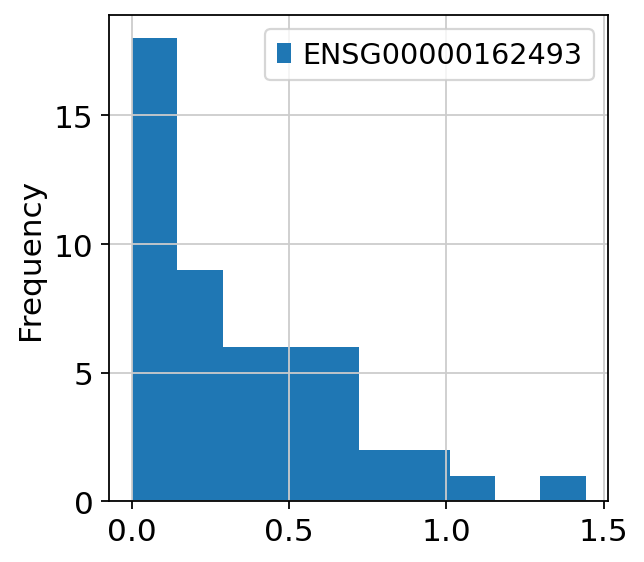

In [370]:
adata[ adata.obs.cell_type=="Alveolar cell type 1", adata.var.symbol=="PDPN"].to_df().plot.hist()

Compared to AT2 cells the distrbution is mucho fatter and longer.

<Axes: ylabel='Frequency'>

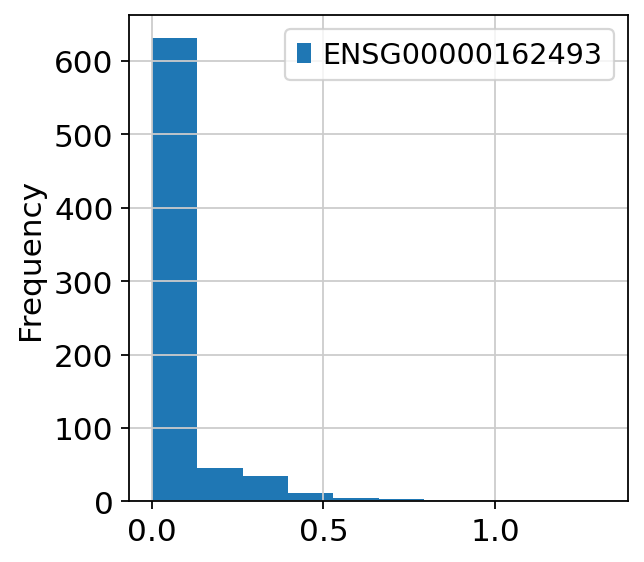

In [369]:
adata[ adata.obs.cell_type=="Alveolar cell type 2", adata.var.symbol=="PDPN"].to_df().plot.hist()

### Uncertainty of predictions

Passing in `soft=True` to SCANVI’s `predict` method returns prediction probabilities from the cell type classifier. However, these shouldn’t be interpreted as p-values or significance levels, nor are they typically well calibrated (i.e. the classifier is confident even when giving wrong predictions).

But I gather that the uncertainty we get from the distances in the neighbourhood graph embedding are also not p-values or significance levels.

In [26]:
uncerts = model.predict(soft=True)

# uncerts.index = uncerts.index.str.split('_').str[1]
# uncerts['barcode'] = uncerts.index
uncerts_types = query_latent.obs.loc[:,['cell_type']].join(uncerts, how='right')
uncerts_types

,cell_type,Alveolar cell type 1,Alveolar cell type 2,B cell,B cell dividing,Ciliated,Club,DC mature,Endothelial cell arterial,Endothelial cell capillary,...,Tumor cells LUAD mitotic,Tumor cells LUSC,Tumor cells LUSC mitotic,Tumor cells NSCLC mixed,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,transitional club/AT2
index,,,,,,,,,,,,,,,,,,,,,
0,T cell CD4,6.052228e-15,1.040592e-10,5.143285e-14,8.007038e-14,3.184973e-14,1.385852e-18,1.046292e-13,2.132462e-14,2.564142e-15,...,6.950927e-19,6.753809e-15,1.926529e-22,3.396745e-20,1.559175e-15,1.076328e-14,2.931471e-22,1.192920e-13,5.523499e-14,3.269295e-11
1,T cell CD8 effector memory,1.414293e-08,4.627492e-11,1.668139e-13,8.495260e-13,1.251253e-12,9.789143e-13,6.133516e-12,5.752834e-12,1.569907e-13,...,6.665841e-14,7.369999e-15,6.240673e-17,1.549722e-16,5.708648e-14,3.226383e-12,1.532305e-15,2.670398e-11,6.346049e-14,5.135571e-10
2,Tumor cells NSCLC mixed,7.548434e-11,1.059154e-15,6.825567e-16,2.638705e-18,1.075016e-10,2.206578e-12,1.762457e-14,5.120830e-19,3.659496e-19,...,1.383945e-12,4.885837e-11,3.096233e-16,9.999758e-01,3.933279e-18,2.824304e-19,1.061225e-23,1.935959e-20,1.451097e-17,2.042740e-10
3,T cell CD8 effector memory,2.657039e-09,5.372257e-11,1.585849e-13,8.783921e-14,7.633645e-13,2.527836e-13,2.743474e-10,5.770781e-12,1.078576e-12,...,9.461264e-15,8.626780e-15,3.479497e-18,2.085702e-15,1.084243e-14,2.617549e-12,8.787163e-16,2.611261e-08,1.253572e-13,2.273425e-11
4,Plasma cell,1.498463e-13,1.874215e-08,1.786319e-11,1.121098e-14,7.901822e-08,9.227293e-06,7.320728e-12,7.553840e-14,4.935353e-09,...,4.949580e-12,3.229433e-12,3.359129e-16,1.022656e-10,3.980691e-15,1.375687e-11,5.518931e-15,5.363068e-10,1.546029e-13,7.745913e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11615,Tumor cells LUAD,6.834264e-07,1.053135e-10,3.105288e-11,1.684680e-16,8.532842e-12,7.352101e-14,1.259519e-12,5.389045e-15,1.614174e-17,...,1.262053e-09,6.219511e-09,4.731464e-13,6.811549e-03,7.287805e-15,6.931632e-17,5.602610e-22,3.020290e-18,1.590042e-15,2.580997e-07
11616,Tumor cells LUAD,7.255581e-08,8.310370e-11,1.727515e-11,4.825850e-17,4.365053e-12,7.585715e-13,1.922049e-13,1.035673e-15,3.189009e-18,...,2.652356e-08,1.043519e-07,8.141782e-12,1.868138e-04,5.715128e-14,1.818209e-16,9.557869e-21,1.196090e-19,1.245225e-15,1.671464e-08
11617,T cell regulatory,3.481269e-11,5.307972e-13,2.546944e-13,3.888890e-12,4.498895e-12,1.684338e-14,4.603103e-14,9.149230e-14,4.062454e-15,...,1.919143e-15,6.455676e-12,3.288392e-13,7.568709e-13,4.058191e-13,9.233545e-12,8.421040e-16,2.113138e-13,2.993157e-12,3.100681e-13


<Axes: ylabel='cell_type'>

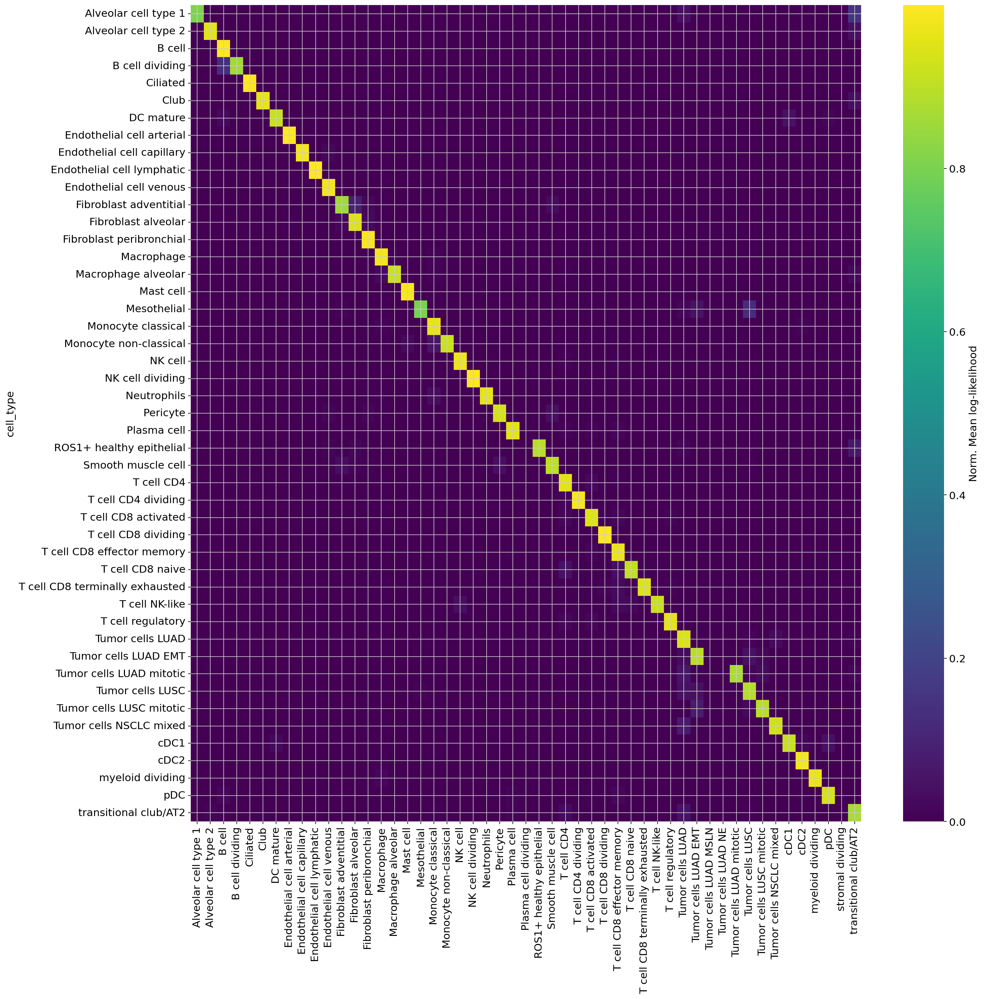

In [28]:
import seaborn as sns
uncerts_group = uncerts_types.groupby(['cell_type']).mean()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(uncerts_group, cmap="viridis", cbar_kws={'label': 'Norm. Mean log-likelihood'}, ax=ax)

We can see that endothelial cell capillar, ROS+1 healty epithelial cells and Tumor cells LUAD NE had the lowest log-lieklihood. That may be because we don't have many LUAD NE in our reference dataset for we don't have metastasis.

But in overall the log-likelihood is pretty on point.

### Prediction score

To actually asses the quality of our reference model we will compare against the actual annotations from the article. 

We must create an equivalence dict for these cell types and the ones we predict.

It helps to put the similar types next to each other to notice incositencies in assignment. But this assignment is very approximate. So the score we can infer from this is only qualitative.

In [366]:
cell_type_mapping = {
    "Cycling cytotoxic (low) T cells": ["T cell CD8 activated", "T cell CD8 effector memory", 'T cell CD8 naive', 'T cell CD8 dividing'],
    "Cycling exhausted cytotoxic T cells": ["T cell CD8 terminally exhausted", 'T cell CD8 dividing'],
    "Exhausted cytotoxic T cells 2": ["T cell CD8 terminally exhausted", "T cell CD8 effector memory"],
    "Cytotoxic T cells (low)": ["T cell CD8 activated", 'T cell CD8 naive', "T cell CD8 effector memory"],
    "Exhausted cytotoxic T cells": ["T cell CD8 terminally exhausted"],
    "CD8+ (low) T cells": ["T cell CD8 activated", 'T cell CD8 effector memory', 'T cell CD8 naive'],
    "Downregulated T cells": ["T cell CD4", 'T cell CD4 dividing'], # downregulated T cells, corresponding to states with low or no expression of genes defining the exhausted, naive, or cytotoxic state, but with moderate expression of the global CD3 markers. The non-cytotoxic state includes moderate expression of CD4 and these cells play an active role in the adaptive immune system through the release of specific cytokines to control and polarise the immune response
    "CD8+ T cells": ["T cell CD8 activated", "T cell CD8 effector memory", "T cell CD8 naive"],
    "Naive T cells": ["T cell CD8 naive", "T cell NK-like"],
    "Tregs": ["T cell regulatory"],
    "Exhausted T cells": ["T cell CD8 terminally exhausted", 'T cell CD4', 'T cell regulatory'],
    "B cells": ["B cell",  "B cell dividing"],
    "LYZ+ B cells": ["B cell",  "B cell dividing"],
    "Plasma B cells": ["Plasma cell", "B cell"],
    "NK cells (higher cytotoxicity)": ["NK cell"],
    "NK cells (lower cytotoxicity)": ["NK cell"],
    "cDC2": ["cDC2"],
    "pDCs": ["pDC", ],
    "STAB+ anti-inflammatory cells": ["pDC", "Macrophage alveolar"],
    "Cycling immature anti-inflammatory myeloid cells": ["Monocyte non-classical", "Monocyte classical", "myeloid dividing", "B cell dividing", "Plasma cell dividing"],
    "Immature anti-inflammatory myeloid cells": ["Monocyte non-classical", "Monocyte classical"],
    "Immature myeloid cells 1": ["Monocyte classical", 'Monocyte non-classical', 'myeloid dividing'],
    "Immature myeloid cells 2": ["Monocyte classical", 'Monocyte non-classical', 'myeloid dividing'],
    "Cycling anti-inflammatory macrophages": ["Macrophage", "Macrophage alveolar", "myeloid dividing" ],
    "SPP1+ cycling anti-inflammatory macrophages": ["Macrophage", "Macrophage alveolar", "myeloid dividing"],
    "SPP1+ macrophages": ["Macrophage alveolar", "Macrophage"],
    "Anti-inflammatory (medium) macrophages": ["Macrophage", "Macrophage alveolar","Monocyte classical", 'Monocyte non-classical'],
    "Anti-inflammatory (high) alveolar macrophages": ["Macrophage", "Macrophage alveolar"],
    "Pro-inflammatory (low) macrophages": ["Macrophage", "Macrophage alveolar", "Monocyte classical", 'Monocyte non-classical', 'Neutrophils'],
    "Pro-inflammatory (medium) macrophages": ["Macrophage", "Macrophage alveolar"],
    "Anti-inflammatory (high) macrophages": ["Macrophage", "Macrophage alveolar"],
    "Pro-inflammatory (high) macrophages": ["Macrophage", "Macrophage alveolar"],
    "Collagen+ macrophages": ["Macrophage", "Macrophage alveolar"],
    # "Cycling myeloid cells,2,0 (to remove)": ["myeloid dividing"], # we romeve htem because it says to remove and they are calssifed as cd4 cells
    "Mast cells": ["Mast cell"],
    # "Mast cells,3 (to remove)": ["Mast cell"],
    # "Mast cells,9 (to remove)": ["Mast cell"],
    "Cycling mast cells": ["myeloid dividing", "Mast cell"],
    "CAMLs": ["Macrophage", "Macrophage alveolar", "Alveolar cell type 1", "Alveolar cell type 2", "transitional club/AT2","Tumor cells LUAD mitotic",
        "Tumor cells LUAD NE",
        "Tumor cells LUAD EMT"],
    "AT2 cells": ["Alveolar cell type 2",
        "Alveolar cell type 1",
        "Club",
        "ROS1+ healthy epithelial",
        "Tumor cells LUSC",
        "Tumor cells LUSC mitotic",
        "Tumor cells NSCLC mixed",
        "Tumor cells LUAD",
        "Tumor cells LUAD mitotic",
        "Tumor cells LUAD NE",
        "Tumor cells LUAD EMT"
                 ],
    "Ciliated epithelial cells": ["Ciliated"],
    "Epithelial cells": ["stromal dividing",
        "transitional club/AT2",
        "Alveolar cell type 2",
        "Alveolar cell type 1",
        "Ciliated",
        "Club",
        "ROS1+ healthy epithelial",
        "Tumor cells LUSC",
        "Tumor cells LUSC mitotic",
        "Tumor cells NSCLC mixed",
        "Tumor cells LUAD",
        "Tumor cells LUAD mitotic",
        "Tumor cells LUAD NE",
        "Tumor cells LUAD EMT"
                        ],
    "Cycling epithelial cells": ["stromal dividing",
        "transitional club/AT2",
        "Alveolar cell type 2",
        "Alveolar cell type 1",
        "Tumor cells LUSC",
        "Tumor cells LUSC mitotic",
        "Tumor cells NSCLC mixed",
        "Tumor cells LUAD",
        "Tumor cells LUAD mitotic",
        "Tumor cells LUAD NE",
        "Tumor cells LUAD EMT"],
    "Activated adventitial fibroblasts": ["Fibroblast adventitial", "Fibroblast peribronchial", "Smooth muscle cell", "Fibroblast alveolar", 'stromal dividing'],
    "Transitioning epithelial cells": ["transitional club/AT2",
        "Alveolar cell type 2",
        "Alveolar cell type 1",
        "Club",
        "ROS1+ healthy epithelial",
        "Tumor cells LUSC",
        "Tumor cells LUSC mitotic",
        "Tumor cells NSCLC mixed",
        "Tumor cells LUAD",
        "Tumor cells LUAD mitotic",
        "Tumor cells LUAD NE",
        "Tumor cells LUAD EMT"],
    "Cycling epithelial cells 2": ["Endothelial cell venous", "Fibroblast adventitial"],
    "Lymphatic endothelial cells": ["Endothelial cell arterial",
        "Endothelial cell lymphatic",
        "Endothelial cell venous",
        "Endothelial cell capillary",
        "Smooth muscle cell",
                                   ],
}


We are going to sum the percentage of cells in a source type that were predicted in the corresponding predicted cell types.

The mean is going to be our measure of accuracy. True postivies.

In [367]:
df = query_latent.obs.groupby(["cell_type", "source_type"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

accs = {}
for source_type, pred_types in cell_type_mapping.items():
    accs[source_type] = sum(norm_df.loc[pred_types, source_type])

print("Accuracy: ", np.mean(list(accs.values())))

Accuracy:  0.5988344827677585


In [365]:
accs
sorted_dict = dict(sorted(accs.items(), key=lambda item: item[1]))
sorted_dict

{'Cycling myeloid cells,2,0 (to remove)': 0.0,
 'Cycling epithelial cells 2': 0.0,
 'Immature myeloid cells 2': 0.002954694681549573,
 'Exhausted T cells': 0.0034482758620689655,
 'Immature anti-inflammatory myeloid cells': 0.007029876977152899,
 'Cycling epithelial cells': 0.0096051227321238,
 'Naive T cells': 0.026494277236116998,
 'Mast cells,9 (to remove)': 0.027777777777777776,
 'Exhausted cytotoxic T cells 2': 0.04148894920511826,
 'NK cells (lower cytotoxicity)': 0.05615969015343364,
 'Immature myeloid cells 1': 0.056837366347777155,
 'Cycling cytotoxic (low) T cells': 0.12233375156838143,
 'Cytotoxic T cells (low)': 0.13432647393005934,
 'STAB+ anti-inflammatory cells': 0.14788732394366197,
 'Pro-inflammatory (high) macrophages': 0.22520808561236624,
 'CD8+ (low) T cells': 0.2641035803937112,
 'Cycling exhausted cytotoxic T cells': 0.31354466858789626,
 'Collagen+ macrophages': 0.35691987513007284,
 'Exhausted cytotoxic T cells': 0.36363636363636365,
 'Mast cells,3 (to remove)'

## Save predictions

In [29]:
adata_query.obs

,sample,patient_id,tissue_type,W_no,date_of_surgery,topography,morphology,histo_subtype,tnm,sex,...,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,cell_type_tumor,dataset,_scvi_batch,_scvi_labels
index,,,,,,,,,,,,,,,,,,,,,
0,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,60.767974,70.604575,81.633987,442.0,6.093570,7.222222,Unknown,p033t,14,51
1,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,46.457581,57.423285,72.766245,427.0,6.059123,9.634477,Unknown,p033t,14,51
2,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,45.855331,52.939849,64.451063,5157.0,8.548305,23.270611,Unknown,p033t,14,51
3,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,54.370738,64.868775,78.507956,561.0,6.331502,11.593305,Unknown,p033t,14,51
4,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,80.809399,93.864230,100.000000,19.0,2.995732,2.480418,Unknown,p033t,14,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11615,p019t,p019,Tumor,W/2020/003111,2019-11-12,C34.1 (Lungenoberlappen),M8140/3 (Adenokarzinom o.n.A.),acinar,pT2a pN2a1 (1/16) G2 R0 L0 V0 PL1 Pn0,M,...,58.934046,64.884836,73.980033,5021.0,8.521584,39.470165,Unknown,p019t,12,51
11616,p019t,p019,Tumor,W/2020/003111,2019-11-12,C34.1 (Lungenoberlappen),M8140/3 (Adenokarzinom o.n.A.),acinar,pT2a pN2a1 (1/16) G2 R0 L0 V0 PL1 Pn0,M,...,46.040422,55.581543,66.864116,4162.0,8.333991,10.580908,Unknown,p019t,12,51
11617,p019t,p019,Tumor,W/2020/003111,2019-11-12,C34.1 (Lungenoberlappen),M8140/3 (Adenokarzinom o.n.A.),acinar,pT2a pN2a1 (1/16) G2 R0 L0 V0 PL1 Pn0,M,...,49.603858,61.729246,77.264898,232.0,5.451038,7.991733,Unknown,p019t,12,51


In [35]:
query_latent.obs['cell_type']

index
0                        T cell CD4
1        T cell CD8 effector memory
2           Tumor cells NSCLC mixed
3        T cell CD8 effector memory
4                       Plasma cell
                    ...            
11615              Tumor cells LUAD
11616              Tumor cells LUAD
11617             T cell regulatory
11618    T cell CD8 effector memory
11619    T cell CD8 effector memory
Name: cell_type, Length: 11620, dtype: object

In [40]:
adata_query.obs

,sample,patient_id,tissue_type,W_no,date_of_surgery,topography,morphology,histo_subtype,tnm,sex,...,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,cell_type_tumor,dataset,_scvi_batch,_scvi_labels
index,,,,,,,,,,,,,,,,,,,,,
0,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,60.767974,70.604575,81.633987,442.0,6.093570,7.222222,T cell CD4,p033t,14,51
1,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,46.457581,57.423285,72.766245,427.0,6.059123,9.634477,T cell CD8 effector memory,p033t,14,51
2,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,45.855331,52.939849,64.451063,5157.0,8.548305,23.270611,Tumor cells NSCLC mixed,p033t,14,51
3,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,54.370738,64.868775,78.507956,561.0,6.331502,11.593305,T cell CD8 effector memory,p033t,14,51
4,p033t,p033,Tumor,W/2020/000165,2020-07-01,C34.3 (Lungenunterlappen),M8140/3 (Adenokarzinom o.n.A.),(micro)papillary,pT3 pN0 (0/18) G3 R0 L0 V0 Pn0,F,...,80.809399,93.864230,100.000000,19.0,2.995732,2.480418,Plasma cell,p033t,14,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11615,p019t,p019,Tumor,W/2020/003111,2019-11-12,C34.1 (Lungenoberlappen),M8140/3 (Adenokarzinom o.n.A.),acinar,pT2a pN2a1 (1/16) G2 R0 L0 V0 PL1 Pn0,M,...,58.934046,64.884836,73.980033,5021.0,8.521584,39.470165,Tumor cells LUAD,p019t,12,51
11616,p019t,p019,Tumor,W/2020/003111,2019-11-12,C34.1 (Lungenoberlappen),M8140/3 (Adenokarzinom o.n.A.),acinar,pT2a pN2a1 (1/16) G2 R0 L0 V0 PL1 Pn0,M,...,46.040422,55.581543,66.864116,4162.0,8.333991,10.580908,Tumor cells LUAD,p019t,12,51
11617,p019t,p019,Tumor,W/2020/003111,2019-11-12,C34.1 (Lungenoberlappen),M8140/3 (Adenokarzinom o.n.A.),acinar,pT2a pN2a1 (1/16) G2 R0 L0 V0 PL1 Pn0,M,...,49.603858,61.729246,77.264898,232.0,5.451038,7.991733,T cell regulatory,p019t,12,51


In [37]:
adata_query.obs['cell_type_tumor'] = query_latent.obs['cell_type']

In [39]:
adata_query.obs.to_csv(f'{backup_dir}/{name}_predicted.csv')

In [32]:
df = query_latent.obs.groupby(["source_type", "cell_type"]).size().unstack(fill_value=0)
# df
norm_df = df / df.sum(axis=0)
norm_df.filter(like='Tumor')

KeyError: 'source_type'